In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

from utils import set_to_nan_based_on_likelihood, plot_ebc,filter_and_interpolate

def ebc_bins(dlc_df, bin_size_angle=6,bin_size_distance=80): 
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    angle_bins = np.arange(0,360,bin_size_angle)

    diagonal_distance_arena = math.hypot(top_right_corner[0] - bottom_left_corner[0], top_right_corner[1] - bottom_left_corner[1])
    distance_bins = np.arange(0,diagonal_distance_arena,bin_size_distance)
    return distance_bins,angle_bins

def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.

    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

def lineLineIntersection(A, B, C, D):
    # Line AB represented as a1x + b1y = c1
    a1 = B[1] - A[1]
    b1 = A[0] - B[0]
    c1 = a1*(A[0]) + b1*(A[1])
 
    # Line CD represented as a2x + b2y = c2
    a2 = D[1] - C[1]
    b2 = C[0] - D[0]
    c2 = a2*(C[0]) + b2*(C[1])
 
    determinant = a1*b2 - a2*b1
 
    if (determinant == 0):
        # The lines are parallel. This is simplified
        # by returning a pair of FLT_MAX
        return 'parallel'
    else:
        x = (b2*c1 - b1*c2)/determinant
        y = (a1*c2 - a2*c1)/determinant
        return (x, y)


def calaculate_ebc_head(dlc_df,left_drive_x,left_drive_y,right_drive_x,right_dirve_y,ebc_angle_bin_size,ebc_dist_bin_size):
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)
    ebc_data_final = []
    for i in range(len(left_drive_x)):
        print(i, len(left_drive_x), "egocentric head") #TO VIEW PROGRESS
        ebc_bins_total = np.zeros((len(distance_bins),len(angle_bins)))
        for angle in range(0,360,3):
            center_neck_pos = (left_drive_x[i],left_drive_y[i])
            center_haunch_pos = (right_drive_x[i],right_dirve_y[i]) 
            center_neck_pos = rotate(center_haunch_pos,center_neck_pos,angle=math.radians(-1*angle))
            body_angle_radian_frame = math.atan2(center_haunch_pos[1]-center_neck_pos[1],center_haunch_pos[0]-center_neck_pos[0])

            body_angle_deg_frame = math.degrees(body_angle_radian_frame)

            if body_angle_deg_frame<0:
                body_angle_deg_frame = 360+body_angle_deg_frame
            

            if(body_angle_deg_frame==0):
                #left wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index]+=1

            elif(body_angle_deg_frame>0 and body_angle_deg_frame<90):
                #left wall and top wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame==90):
                #top wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>90 and body_angle_deg_frame<180):
                #top wall and right wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
                
            elif(body_angle_deg_frame==180):
                #right wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins) 
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>180 and body_angle_deg_frame<270):
                #right wall and bottom wall
                
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame == 270):
                #bottom wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,bottom_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            else:
                #bottom wall and left wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                if min_distance<=800:
                    angle_bin_index = np.digitize(angle,angle_bins)
                    #print(i,min_distance,distance_bin_index,angle_bin_index)
                    ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
        
        ebc_data_final.append(ebc_bins_total)
    return np.array(ebc_data_final)

In [11]:
file = r'\\rhea\E\20240608\WT0008LN\FM\20240608_WT0008LN_M_FM_DMS1_angie_ephys_topDLCephys.h5'
dlc_df = pd.read_hdf(file, 'dlc_df')
phy_df = pd.read_hdf(file, 'phy_df')

In [12]:
file = r'\\rhea\E\20240608\WT0008LN\FM\20240608_WT0008LN_M_FM_DMS1_angie_ephys_topDLCephys.h5'
dlc_df = pd.read_hdf(file, 'dlc_df')
phy_df = pd.read_hdf(file, 'phy_df')

fps = 59.99
likelihood_threshold = 0.95
model_dt = 1/fps # Frame duration in seconds
bin_width = 20 #bin width angles
speed_threshold=0.25
ebc_angle_bin_size = 3
ebc_dist_bin_size = 40

columns_of_interest = ['left_drive','right_drive', 'time']

# Adding timestamps to dlc file and only considering columns of interest
dlc_df['time'] = np.arange(len(dlc_df))/fps

#filter and interpolate
model_data_df,model_t = filter_and_interpolate(dlc_df,columns_of_interest,likelihood_threshold,model_dt,fps)

model_data_df = model_data_df[model_data_df['speed']>speed_threshold]

#model_data_df = model_data_df.dropna()

center_neck_x = list(model_data_df['left_drive x'])
center_neck_y = list(model_data_df['left_drive y'])
center_haunch_x = list(model_data_df['right_drive x'])
center_haunch_y = list(model_data_df['right_drive y'])


ebc_data = calaculate_ebc_head(dlc_df, center_neck_x,center_neck_y,center_haunch_x,center_haunch_y,ebc_angle_bin_size,ebc_dist_bin_size)
distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)

ebc_data_avg = np.sum(ebc_data,axis=0)
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, 121)

model_data_df['egocentric'] = list(ebc_data)

0 214759 egocentric head
1 214759 egocentric head
2 214759 egocentric head
3 214759 egocentric head
4 214759 egocentric head
5 214759 egocentric head
6 214759 egocentric head
7 214759 egocentric head
8 214759 egocentric head
9 214759 egocentric head
10 214759 egocentric head
11 214759 egocentric head
12 214759 egocentric head
13 214759 egocentric head
14 214759 egocentric head
15 214759 egocentric head
16 214759 egocentric head
17 214759 egocentric head
18 214759 egocentric head
19 214759 egocentric head
20 214759 egocentric head
21 214759 egocentric head
22 214759 egocentric head
23 214759 egocentric head
24 214759 egocentric head
25 214759 egocentric head
26 214759 egocentric head
27 214759 egocentric head
28 214759 egocentric head
29 214759 egocentric head
30 214759 egocentric head
31 214759 egocentric head
32 214759 egocentric head
33 214759 egocentric head
34 214759 egocentric head
35 214759 egocentric head
36 214759 egocentric head
37 214759 egocentric head
38 214759 egocentric h

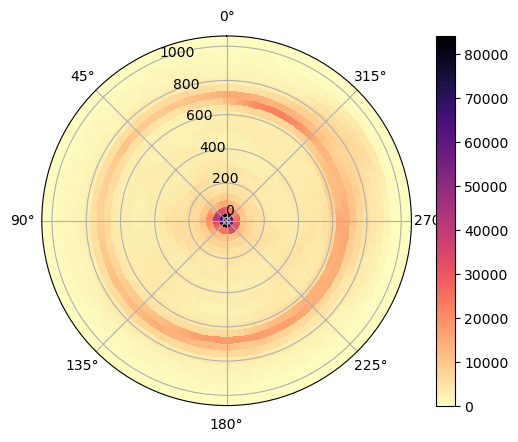

In [13]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, ebc_data_avg, cmap="magma_r")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show() 

In [14]:
cell_numbers = phy_df.index
ebc_plot_data = []
n=120
m=27
MRLS = []
MALS = []
for i in cell_numbers:
    spike_times = phy_df.loc[i]['spikeT']

    #removing spike times after camera stopped
    spike_times = spike_times[spike_times<=max(model_t)]

    #binning spikes
    sp_count_ind = np.digitize(spike_times,bins = model_t)

    #-1 because np.digitze is 1-indexed
    sp_count_ind = [i-1 for i in sp_count_ind]

    sp_count_ind = [i for i in sp_count_ind if i in model_data_df.index]

    cell_spikes_egocentric = model_data_df['egocentric'].loc[sp_count_ind]  

    cell_spikes_avg = np.sum(cell_spikes_egocentric,axis = 0)
    cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
    
    cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0
    
    ebc_plot_data.append(cell_spikes_avg)

    firing_rates = cell_spikes_avg.copy().T
    theta = abins.copy()
    MR = (1 / (n * m)) * np.sum(firing_rates * np.exp(1j * theta[:, None]), axis=(0, 1))
    MRL = np.abs(MR)
    MRA = np.angle(MR)

    MRLS.append(MRL)
    MALS.append(MRA)


C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_18144\3861673117.py:24: RuntimeWarning: invalid value encounte

In [ ]:
ebc*60

array([[0.13661168, 0.14179683, 0.14523405, ..., 0.12349732, 0.13168786,
        0.13659775],
       [0.2273647 , 0.2198654 , 0.22749787, ..., 0.19794014, 0.19179163,
        0.21004039],
       [0.26891848, 0.27324182, 0.26689683, ..., 0.2955665 , 0.27976754,
        0.23927824],
       ...,
       [0.12024048, 0.        , 0.17241379, ..., 0.        , 0.        ,
        0.11627907],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

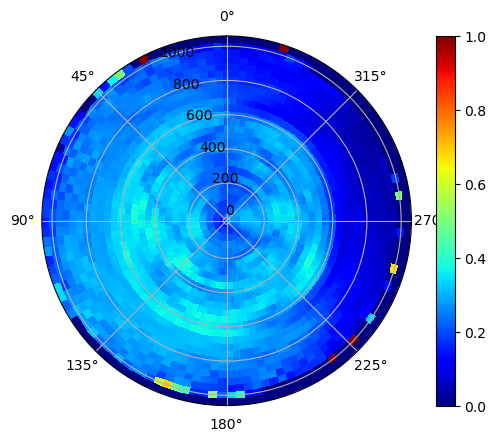

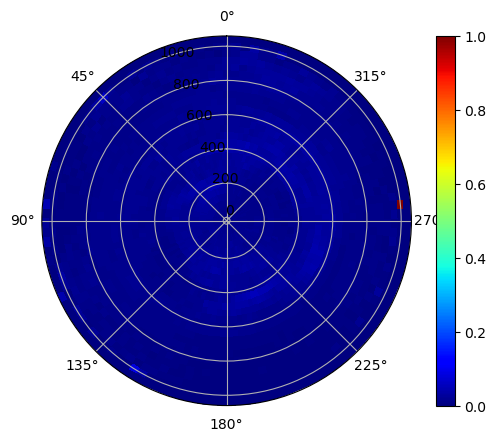

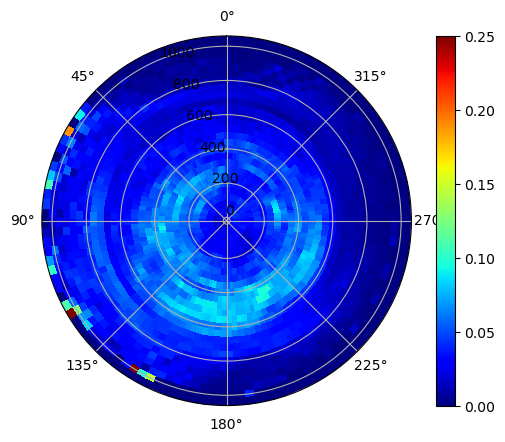

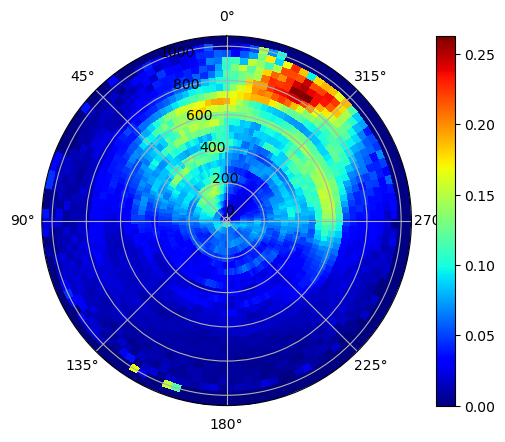

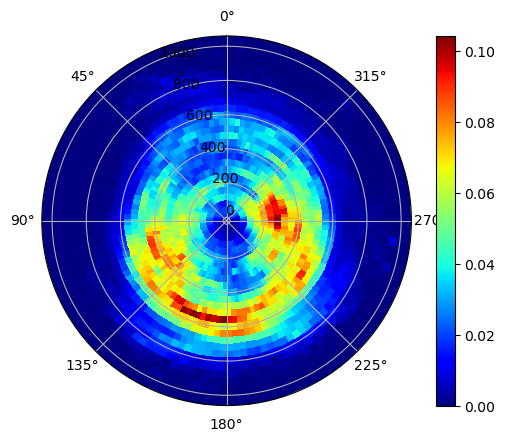

...

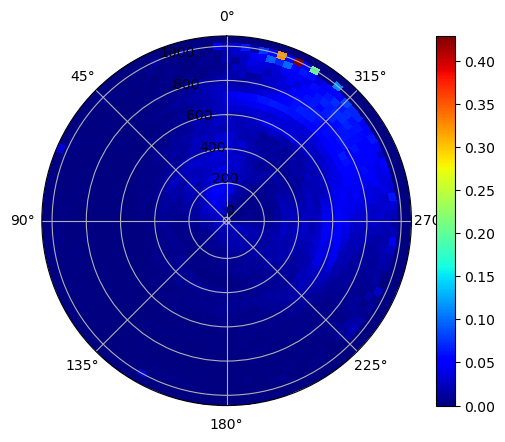

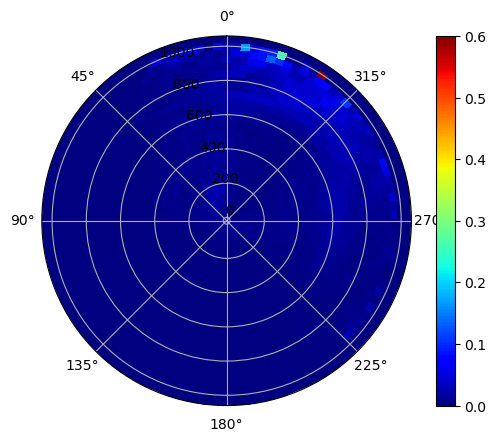

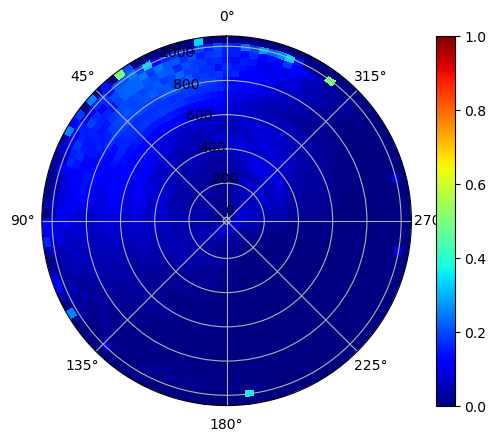

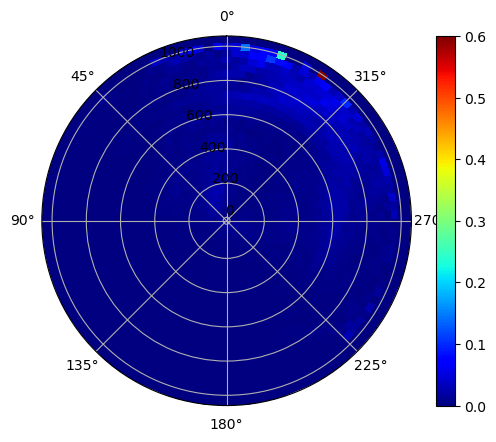

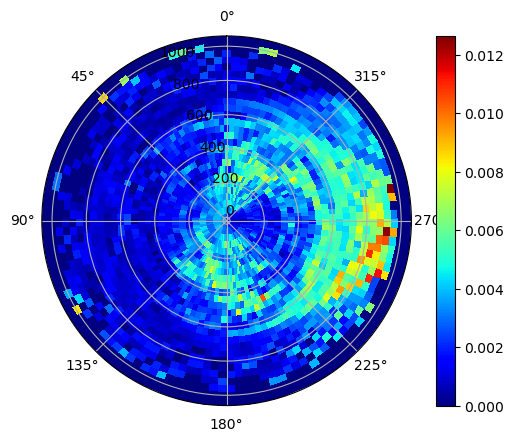

In [15]:
for ebc in ebc_plot_data:
    rbins = distance_bins.copy()
    abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

    A, R = np.meshgrid(abins, rbins)
    fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
    pc = ax.pcolormesh(A, R, ebc, cmap="jet")
    ax.set_theta_direction(1)
    ax.set_theta_offset(np.pi / 2.0)
    fig.colorbar(pc)  
    plt.show()  

In [16]:
len(model_data_df['egocentric'])

214759

In [17]:
len(model_t)

217771

In [ ]:
import cv2

In [21]:
spike_times = phy_df.iloc[5]['spikeT']

In [22]:
sp_count_ind = np.digitize(spike_times,bins = model_t)

#-1 because np.digitze is 1-indexed
sp_count_ind = [i-1 for i in sp_count_ind]

In [20]:
cell_spikes_egocentric = model_data_df['egocentric'].loc[sp_count_ind]  

KeyError: '[54872, 56512, 56513, 58202, 86030, 86064, 86865, 87053, 108692, 149013, 165055, 165087, 181967, 185462, 191800, 214695, 216485, 216523, 216599, 216614, 216637, 216651, 216668, 216693, 216694, 216695, 217031, 217041, 217081, 217102, 217166, 217181, 217426, 217491, 217530, 217533] not in index'

In [ ]:
cell_spikes_avg = np.sum(cell_spikes_egocentric,axis = 0)
cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)

C:\Users\plab\AppData\Local\Temp\ipykernel_36784\1976439483.py:2: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)


In [ ]:
phy_df.iloc[30]

Amplitude                                               1049.0
ContamPct                                                  0.0
KSLabel                                                   good
amp                                                  80.870056
ch                                                           3
depth                                                    700.0
fr                                                    0.163975
group                                                     good
n_spikes                                                   597
sh                                                           0
waveform     [0.0550109744, 0.078972213, 0.0787172541, 0.08...
spikeT       [48.332766666666664, 50.636966666666666, 50.79...
t0                                                 39408.24791
Name: 459, dtype: object

In [ ]:
np.isnan(cell)

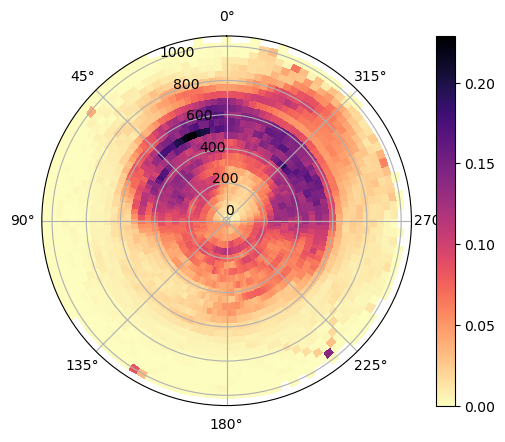

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, cell_spikes_avg, cmap="magma_r")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

GLM

11.998000000000001

In [ ]:
ebc_data.shape

(217771, 27, 120)

In [ ]:
spike_data = np.zeros(len(model_t))

# Use np.add.at for efficient indexing
np.add.at(spike_data, sp_count_ind, 1)

In [ ]:
ebc_data_flatten = ebc_data.reshape(ebc_data.shape[0],ebc_data.shape[1]*ebc_data.shape[2])

<StemContainer object of 3 artists>

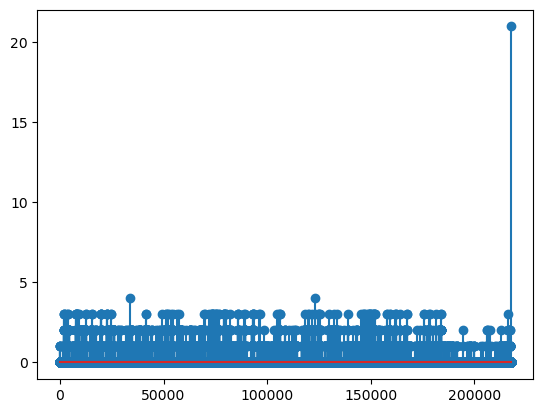

In [ ]:
plt.stem(spike_data)

In [ ]:
X = ebc_data_flatten.copy()
y = spike_data.copy()

In [ ]:
from sklearn import linear_model

In [ ]:
clf = linear_model.PoissonRegressor()

In [ ]:
clf.fit(X,y)

PoissonRegressor()

In [ ]:
clf.coef_

array([-0.0095417 , -0.00959285, -0.00961561, ...,  0.        ,
        0.        ,  0.        ])

In [ ]:
weights = clf.coef_
weights = weights.reshape(27,120)

In [ ]:
import numpy as np

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [ ]:
norm_weights = NormalizeData(weights)

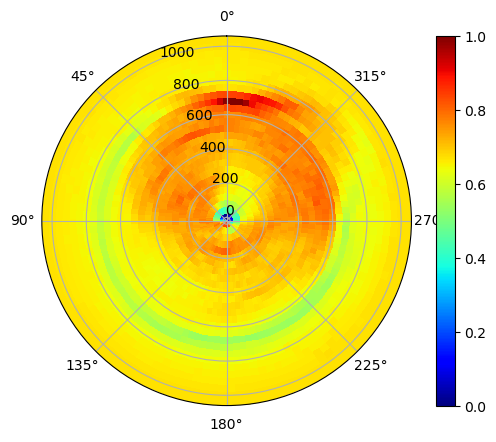

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, norm_weights, cmap="jet")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

In [ ]:
cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0
norm_cell_spikes = NormalizeData(cell_spikes_avg)

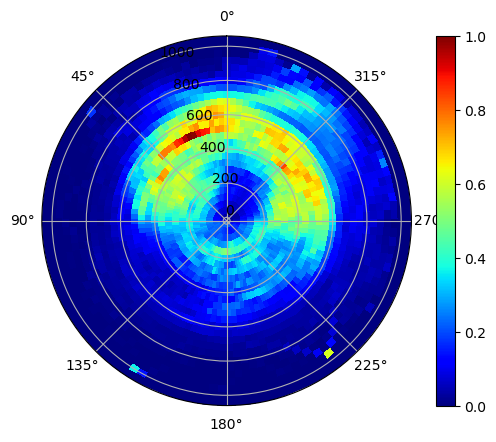

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, norm_cell_spikes, cmap="jet")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

In [ ]:
spike_times = phy_df.iloc[15]['spikeT']

In [ ]:
sp_count_ind = np.digitize(spike_times,bins = model_t)

#-1 because np.digitze is 1-indexed
sp_count_ind = [i-1 for i in sp_count_ind]

In [ ]:
cell_spikes_egocentric = model_data_df['egocentric'].loc[sp_count_ind]  

In [ ]:
cell_spikes_avg = np.sum(cell_spikes_egocentric,axis = 0)
cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)

C:\Users\plab\AppData\Local\Temp\ipykernel_36784\1976439483.py:2: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)


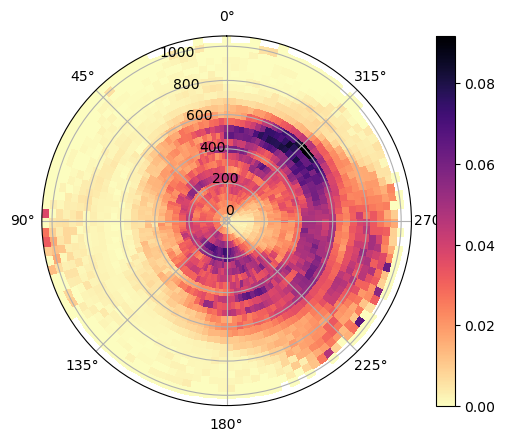

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, cell_spikes_avg, cmap="magma_r")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

GLM

In [ ]:
ebc_data.shape

(217771, 27, 120)

In [ ]:
spike_data = np.zeros(len(model_t))

# Use np.add.at for efficient indexing
np.add.at(spike_data, sp_count_ind, 1)

In [ ]:
ebc_data_flatten = ebc_data.reshape(ebc_data.shape[0],ebc_data.shape[1]*ebc_data.shape[2])

<StemContainer object of 3 artists>

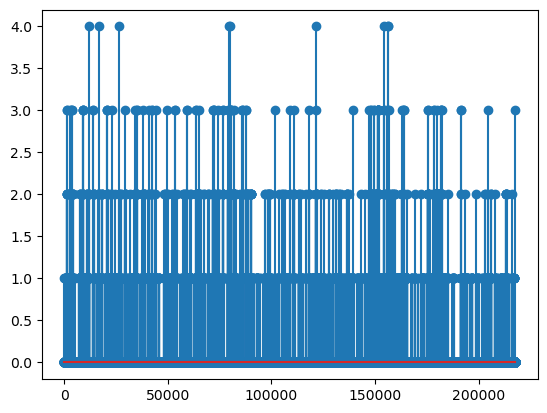

In [ ]:
plt.stem(spike_data)

In [ ]:
X = ebc_data_flatten.copy()
y = spike_data.copy()

In [ ]:
from sklearn import linear_model

In [ ]:
clf = linear_model.PoissonRegressor()

In [ ]:
clf.fit(X,y)

PoissonRegressor()

In [ ]:
clf.coef_

array([-0.0020051 , -0.00194806, -0.00192498, ...,  0.        ,
        0.        ,  0.        ])

In [ ]:
weights = clf.coef_
weights = weights.reshape(27,120)

In [ ]:
import numpy as np

def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [ ]:
norm_weights = NormalizeData(weights)

In [ ]:
weights

array([[-2.00510094e-03, -1.94805701e-03, -1.92498067e-03, ...,
        -2.52483549e-03, -2.35772966e-03, -2.14464656e-03],
       [ 3.28277640e-04,  3.20868888e-04,  4.17264206e-04, ...,
         4.43511292e-04,  3.99422010e-04,  3.54219217e-04],
       [ 2.94840224e-04,  3.15091323e-04,  3.02600968e-04, ...,
         3.02622952e-04,  3.50964050e-04,  3.23376855e-04],
       ...,
       [-3.82759047e-05, -4.00289665e-05, -5.18113947e-05, ...,
        -3.14241572e-05, -4.15014549e-05, -3.96933508e-05],
       [-8.35748895e-06, -8.93265276e-06, -1.30305759e-05, ...,
        -9.37336175e-06, -1.31818905e-05, -1.34592046e-05],
       [-7.19841022e-08,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

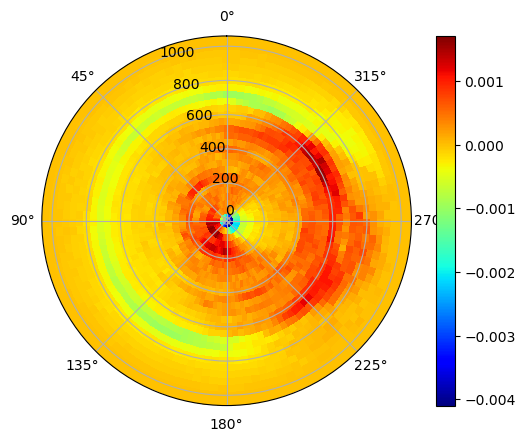

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, weights, cmap="jet")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

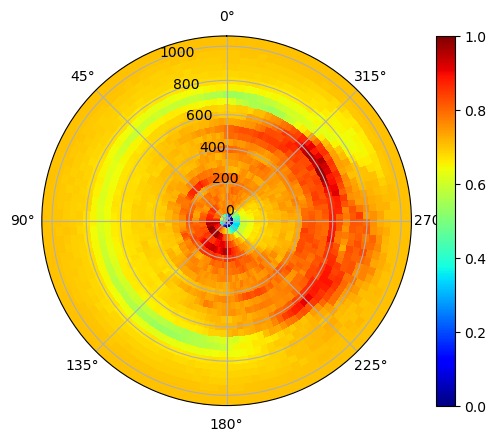

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, norm_weights, cmap="jet")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

In [ ]:
cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0
norm_cell_spikes = NormalizeData(cell_spikes_avg)

In [ ]:
norm_cell_spikes_unshaded = norm_cell_spikes[:-1,:-1]
norm_cell_spikes_unshaded.shape

(26, 119)

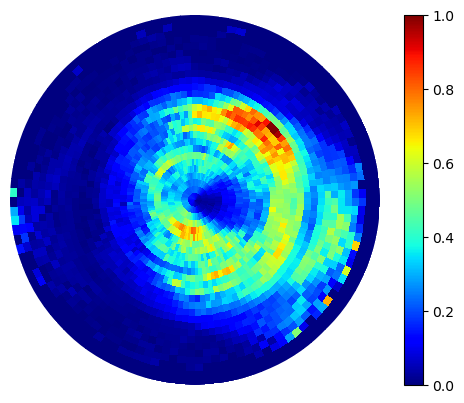

In [ ]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
cell_spikes_avg = cell_spikes_avg[:-1, :-1]
pc = ax.pcolormesh(A, R, norm_cell_spikes, cmap="jet")
ax.set_theta_direction(1)
ax.axis('off')
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

In [ ]:
predicted_spikes = clf.predict(X)

<StemContainer object of 3 artists>

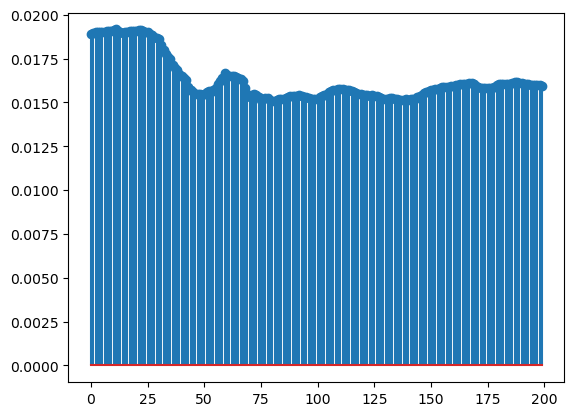

In [ ]:
plt.stem(predicted_spikes[:200])


<StemContainer object of 3 artists>

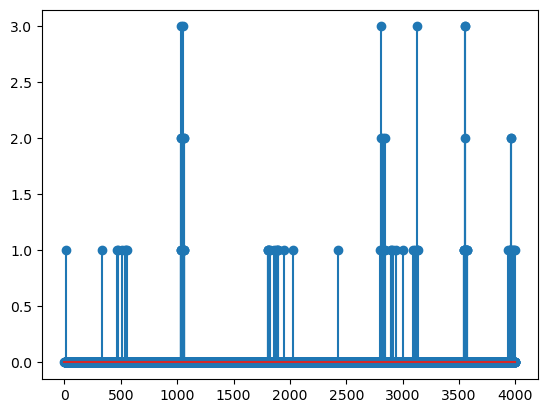

In [ ]:
plt.stem(spike_data[:4000])


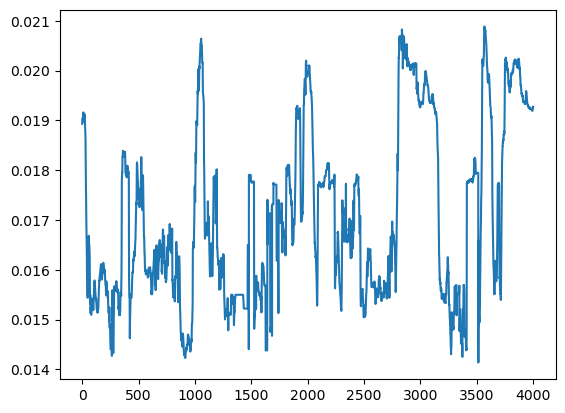

In [ ]:
plt.plot(predicted_spikes[:4000])

In [ ]:
norm_predicted_data = NormalizeData(predicted_spikes)
norm_spike = NormalizeData(spike_data)

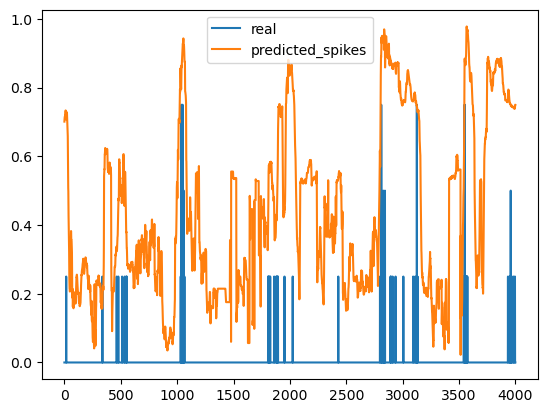

In [ ]:
plt.plot(norm_spike[:4000],label='real')
plt.plot(norm_predicted_data[:4000],label='predicted_spikes')
plt.legend()
plt.show()

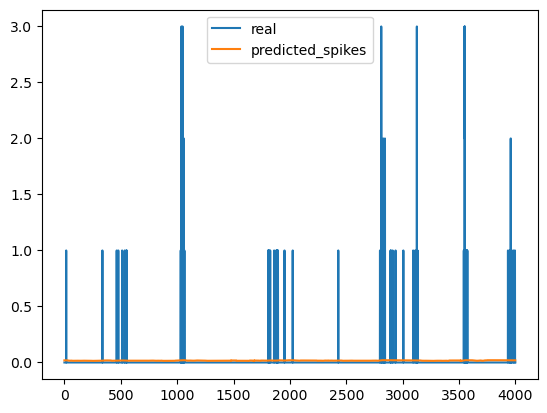

In [ ]:
plt.plot(spike_data[:4000],label='real')
plt.plot(predicted_spikes[:4000],label='predicted_spikes')
plt.legend()
plt.show()

In [ ]:
ch_points_x = list(dlc_df['center_haunch x'])
ch_points_y = list(dlc_df['center_haunch y'])

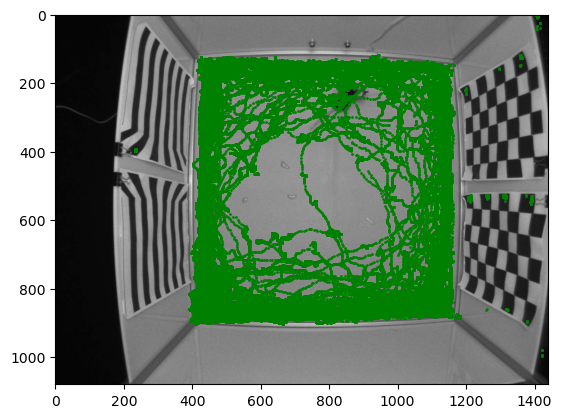

In [ ]:
vid_file = r'\\rhea\D\ephys\20240608\WT0008LN\FM\20240608_WT0008LN_M_FM_DMS1_angie_TOP1.avi'
# vid_file = r"\\rhea\D\ephys\20240607\WT0008LN\FM\20240607_WT0008LN_M_FM_DMS1_angie_TOP1.avi"

vid = cv2.VideoCapture(vid_file)
length = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

vid.set(cv2.CAP_PROP_POS_FRAMES,2)
ret, frame = vid.read()
plt.plot(ch_points_x, ch_points_y, "og", markersize=1)
plt.imshow(frame)

In [ ]:
import os

def get_file_paths(directory, pattern):
    # List to store the full paths of matching files
    file_paths = []

    # Walk through the directory and its subdirectories
    for dirpath, _, filenames in os.walk(directory):
        for filename in filenames:
            if filename.endswith(pattern):
                # Construct the full path and add it to the list
                full_path = os.path.join(dirpath, filename)
                file_paths.append(full_path)

    return file_paths

# Example usage
directory = r'\\rhea\E'  # Replace with your directory path
pattern = 'topDLCephys.h5'
file_paths = get_file_paths(directory, pattern)

# Print the file paths
for path in file_paths:
    print(path)


\\rhea\E\20240608\WT0008LN\FM\20240608_WT0008LN_M_FM_DMS1_angie_ephys_topDLCephys.h5
\\rhea\E\20240617\WT00012R2\FM\20240617_WT00012R2_M_FM_DMS1_angie_ephys_topDLCephys.h5
\\rhea\E\20240629\WT00013L1\FM\20240629_WT00013L1_F_FM_DMS1_angie_ephys_topDLCephys.h5
\\rhea\E\20240704\WT00016R1\FM_DARK\20240704_WT00016R1_M_FM_DARK_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240704\WT00016R1\FM_LIGHT\20240704_WT00016R1_M_FM_LIGHT_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240706\WT00018L1\FM_DARK\20240704_WT00018L1_M_FM_DARK_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240706\WT00018L1\FM_LIGHT\20240706_WT00018L1_M_FM_LIGHT_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240707\WT00018L1\FM\20240707_WT00018L1_M_FM_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240710\WT00018RN\FM_DARK\20240710_WT00018RN_M_FM_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240710\WT00018RN\FM_LIGHT\20240710_WT00018RN_M_FM_LIGHT_DMS_angie_ephys_topDLCephys.h5
\\rhea\E\20240710\WT00018RN\gratings\20240710_WT00018RN_M_gratings_DMS_angie_e

In [ ]:
pd.read_hdf(file_paths[1],'dlc_df')

,nose x,nose y,nose likelihood,left_ear x,left_ear y,left_ear likelihood,right_ear x,right_ear y,right_ear likelihood,center_neck x,...,top_left_corner likelihood,top_right_corner x,top_right_corner y,top_right_corner likelihood,bottom_left_corner x,bottom_left_corner y,bottom_left_corner likelihood,bottom_right_corner x,bottom_right_corner y,bottom_right_corner likelihood
0,565.264893,785.060059,0.914726,598.713562,797.257812,0.983400,598.134949,769.374268,0.987609,602.888977,...,1.0,764.822571,143.312714,1.000000,377.653931,876.120911,0.999982,1123.269531,883.192139,0.999998
1,565.264893,785.135376,0.856966,598.713562,798.446838,0.983243,598.134949,770.283203,0.990697,602.888977,...,1.0,764.822571,144.957947,0.999996,377.653931,876.213867,0.999977,1123.271606,883.192139,0.999998
2,565.264893,785.775696,0.992082,598.713562,799.591858,0.991580,598.134949,771.022644,0.984744,602.888977,...,1.0,1127.015259,145.853500,0.001875,377.653931,876.213867,0.999980,1123.271606,883.344971,0.999998
3,561.382507,785.135376,0.988900,595.123779,799.769958,0.993553,593.769165,771.445435,0.973779,599.294495,...,1.0,1127.015259,145.853500,0.001469,377.653931,876.309753,0.999982,1123.343994,883.344971,0.999998
4,559.968140,785.135376,0.527317,591.507874,800.360779,0.990752,592.447815,772.573608,0.989777,596.167053,...,1.0,1127.138550,145.853500,0.999999,377.490631,876.309753,0.999984,1123.367554,883.352173,0.999998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183208,398.224396,795.749512,0.204766,368.779633,807.213623,0.852368,392.582184,813.407166,0.580841,381.039093,...,1.0,1127.281860,144.836227,1.000000,376.788727,879.201782,0.998081,1123.485840,883.398682,0.999998
183209,398.235260,796.240051,0.224039,369.103302,807.422546,0.861052,392.433838,813.741333,0.591433,381.039093,...,1.0,1127.281860,144.757568,1.000000,376.709991,879.201782,0.998250,1123.529785,883.398682,0.999998
183210,398.235260,797.398315,0.329613,369.104309,807.584290,0.829145,392.090515,814.260315,0.511747,381.008728,...,1.0,1127.281860,144.750259,1.000000,376.548462,879.314575,0.998671,1123.540649,883.386963,0.999998
183211,398.224396,797.398315,0.355134,369.104309,807.584290,0.789077,391.292053,814.260315,0.378798,380.733459,...,1.0,1127.252808,144.723892,1.000000,376.546509,879.314575,0.998216,1123.540649,883.296509,0.999998


In [ ]:
dlc = pd.read_hdf(file_paths[3],'dlc_df')

In [ ]:
save_dir = os.path.dirname(file_paths[i])
save_dir

'\\\\rhea\\E\\20240710\\WT00018RN\\gratings'

'c:\\Users\\plab\\anaconda3\\envs\\pytorchGLM\\lib\\ntpath.py'

0
1
2
3
4
5
6
7
8
9
10


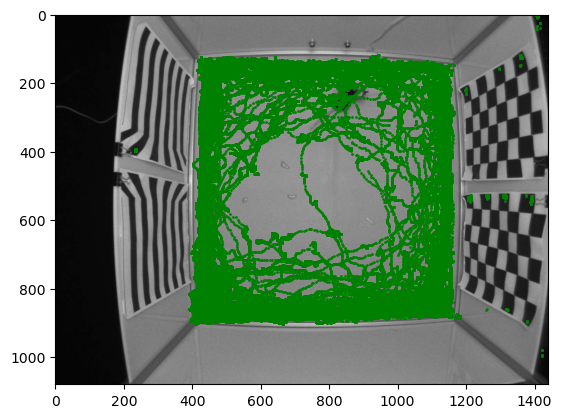

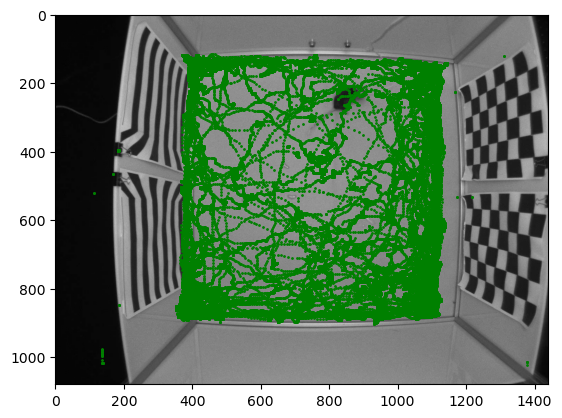

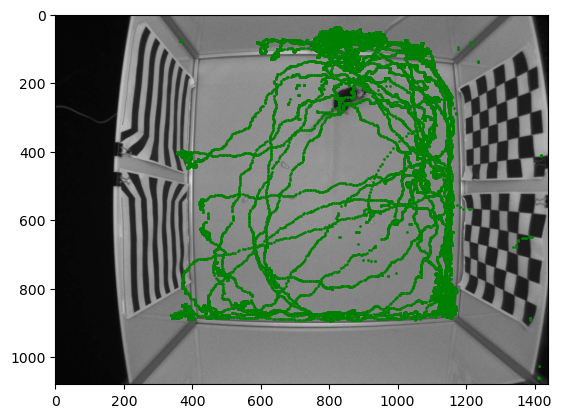

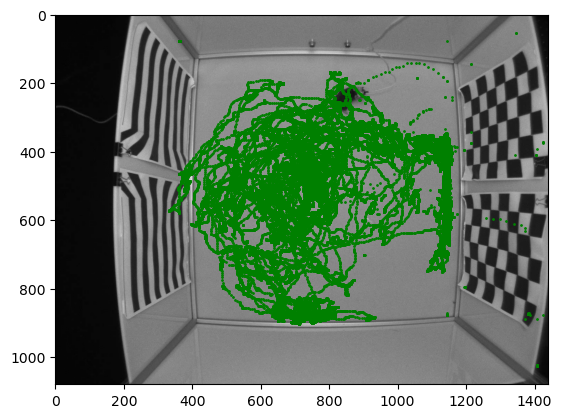

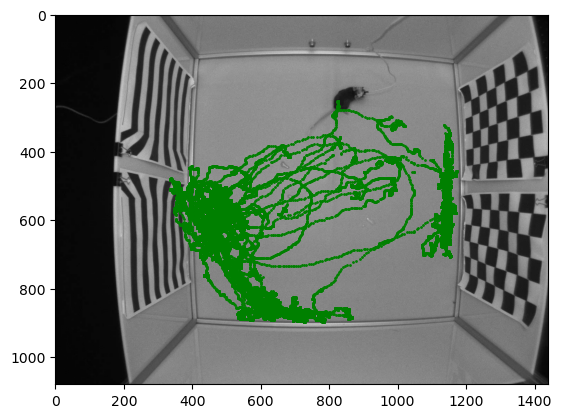

...

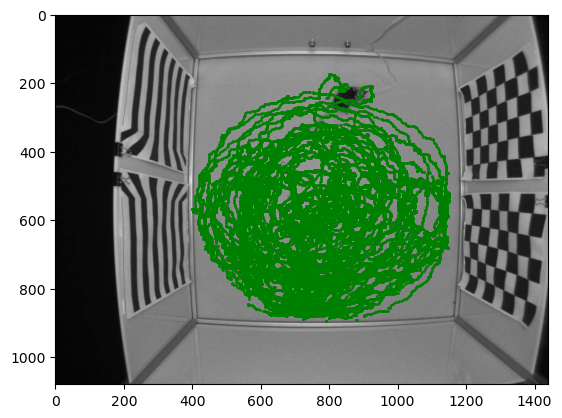

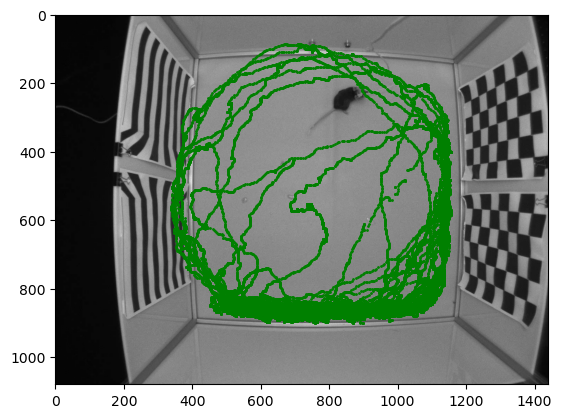

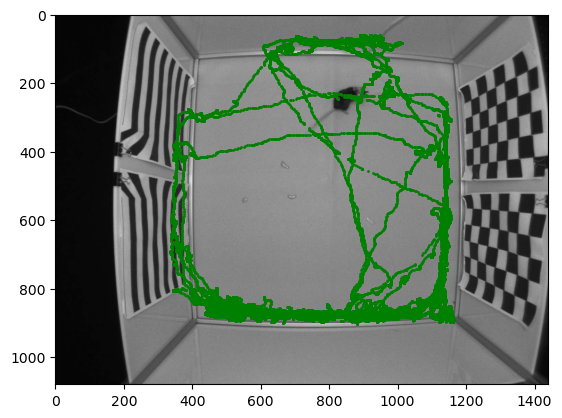

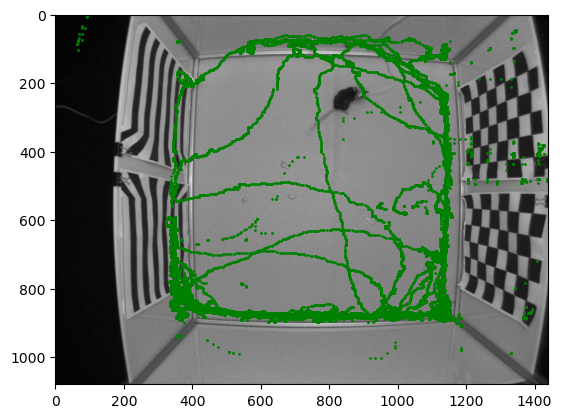

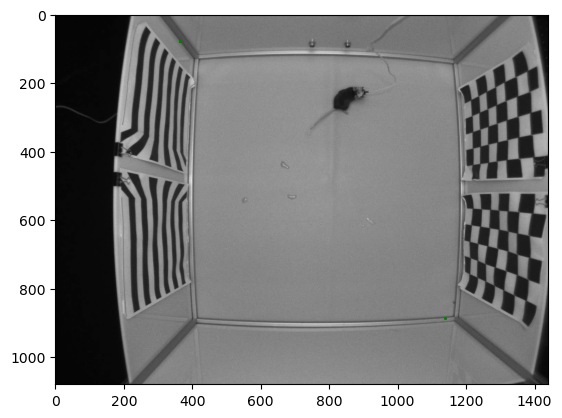

In [ ]:
for i in range(len(file_paths)):
    print(i)
    dlc = pd.read_hdf(file_paths[i],'dlc_df')
    ch_points_x = list(dlc['center_haunch x'])
    ch_points_y = list(dlc['center_haunch y'])
    plt.figure()
    plt.plot(ch_points_x, ch_points_y, "og", markersize=1)
    plt.imshow(frame)

In [ ]:
for i in range(len(file_paths)):
    print(i)
    dlc = pd.read_hdf(file_paths[i],'dlc_df')
    ch_points_x = list(dlc['center_haunch x'])
    ch_points_y = list(dlc['center_haunch y'])
    plt.figure()
    plt.plot(ch_points_x, ch_points_y, "og", markersize=1)
    plt.imshow(frame)
    save_dir = os.path.dirname(file_paths[i])
    save_path = os.path.join(save_dir, 'TrajecoryPlot.png')
    plt.savefig(save_path)
    plt.close()  # Close the plot to free memory

    print(f'Saved plot to {save_path}')

0
Saved plot to \\rhea\E\20240608\WT0008LN\FM\TrajecoryPlot.png
1
Saved plot to \\rhea\E\20240617\WT00012R2\FM\TrajecoryPlot.png
2
Saved plot to \\rhea\E\20240629\WT00013L1\FM\TrajecoryPlot.png
3
Saved plot to \\rhea\E\20240704\WT00016R1\FM_DARK\TrajecoryPlot.png
4
Saved plot to \\rhea\E\20240704\WT00016R1\FM_LIGHT\TrajecoryPlot.png
5
Saved plot to \\rhea\E\20240706\WT00018L1\FM_DARK\TrajecoryPlot.png
6
Saved plot to \\rhea\E\20240706\WT00018L1\FM_LIGHT\TrajecoryPlot.png
7
Saved plot to \\rhea\E\20240707\WT00018L1\FM\TrajecoryPlot.png
8
Saved plot to \\rhea\E\20240710\WT00018RN\FM_DARK\TrajecoryPlot.png
9
Saved plot to \\rhea\E\20240710\WT00018RN\FM_LIGHT\TrajecoryPlot.png
10
Saved plot to \\rhea\E\20240710\WT00018RN\gratings\TrajecoryPlot.png


In [ ]:
file_paths[0]

'\\\\rhea\\E\\20240608\\WT0008LN\\FM\\20240608_WT0008LN_M_FM_DMS1_angie_ephys_topDLCephys.h5'

0       362.898224
1       363.013367
2       363.063385
3       363.063385
4       363.121002
           ...    
4156    363.073639
4157    363.112793
4158    363.103302
4159    363.071686
4160    363.071686
Name: center_haunch x, Length: 4161, dtype: float64

In [ ]:
dlc = pd.read_hdf(file_paths[0],'dlc_df')
dlc

,nose x,nose y,nose likelihood,left_ear x,left_ear y,left_ear likelihood,right_ear x,right_ear y,right_ear likelihood,center_neck x,...,top_left_corner likelihood,top_right_corner x,top_right_corner y,top_right_corner likelihood,bottom_left_corner x,bottom_left_corner y,bottom_left_corner likelihood,bottom_right_corner x,bottom_right_corner y,bottom_right_corner likelihood
0,909.769348,214.987778,0.004158,868.747009,212.513138,0.999967,874.722595,238.307205,0.999922,866.218262,...,1.000000,1157.735107,147.384094,1.000000,416.283600,882.805542,0.999996,1160.410645,878.334351,0.999961
1,910.175110,223.113129,0.040838,870.167114,213.517288,0.999942,875.420105,240.361389,0.999904,866.744385,...,0.999999,1157.752441,147.445938,1.000000,416.289978,882.879761,0.999996,1160.619873,878.334351,0.999962
2,910.969177,224.152679,0.018288,871.623779,214.658569,0.999891,876.547668,242.176163,0.999971,867.851990,...,0.999999,1157.755737,147.493423,1.000000,416.289978,882.963745,0.999995,1160.624634,878.334351,0.999961
3,913.837219,226.147430,0.086194,874.619995,217.177841,0.999887,876.830444,242.759109,0.999991,870.050171,...,0.999999,1157.755737,147.493423,1.000000,416.345856,882.963745,0.999996,1160.619873,878.334351,0.999959
4,915.688721,226.147430,0.042140,876.988159,217.268585,0.999772,878.913574,242.979477,0.999990,873.264526,...,0.999999,1157.776978,147.493423,1.000000,416.345856,882.983032,0.999995,1160.464478,878.437256,0.999965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217767,1105.572998,883.566467,0.488775,1137.604980,885.709839,0.992476,1133.131226,856.159485,0.958673,1142.375366,...,0.999999,1161.073975,147.099243,0.999999,417.492584,884.591858,0.999997,1100.402710,880.392822,0.027099
217768,1105.608521,883.367249,0.553552,1137.089600,885.701111,0.993346,1133.343384,856.159485,0.967168,1142.375366,...,0.999999,1161.073975,147.099243,1.000000,417.461365,884.609375,0.999997,1100.523071,880.392822,0.026555
217769,1105.631958,883.244141,0.481229,1137.089600,884.985229,0.993421,1133.343384,856.159485,0.982298,1141.700806,...,0.999999,1161.034302,147.099243,0.999999,417.445160,884.591858,0.999997,1100.523071,881.038513,0.017365
217770,1105.631958,882.090088,0.275862,1136.937256,884.678101,0.989769,1133.131226,856.159485,0.977025,1141.675659,...,0.999999,1160.892212,147.098999,0.999999,417.410034,884.536560,0.999997,1100.523071,881.038513,0.015648


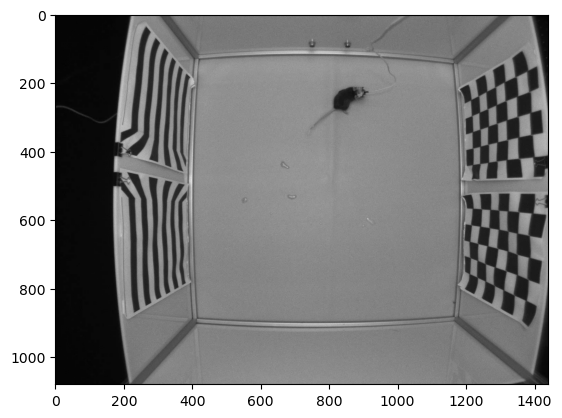

In [ ]:
plt.imshow(frame)